In [30]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import os
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from category_encoders import TargetEncoder
from sklearn.linear_model import LinearRegression
from sklearn.experimental import enable_iterative_imputer  # habilita MICE
from sklearn.impute import IterativeImputer
from sklearn.impute import SimpleImputer
import math
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.preprocessing import StandardScaler, OneHotEncoder, PolynomialFeatures
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

In [2]:
print(os.getcwd())

/Users/santiagoaristizabal/Desktop/Taller_final_AA1/jupyter_notebooks


In [3]:
os.chdir("../data")

In [4]:
print(os.getcwd())

/Users/santiagoaristizabal/Desktop/Taller_final_AA1/data


In [5]:
os.listdir()

['BD_IPSA_1940.xlsx', 'HISTORICO_SUERTES.xlsx']

In [6]:
data_path = "../data"
file_path = os.path.join(data_path, "HISTORICO_SUERTES.xlsx")
print("File path:", file_path)
print("Exists?", os.path.exists(file_path))  # should be True

sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (12, 6)
df = pd.read_excel(file_path)
print(df.head())

File path: ../data/HISTORICO_SUERTES.xlsx
Exists? True
   Período  Hacienda             Nombre  Zona  Tenencia Suerte       Suelo  \
0   201701     80493          LA CONCHA  IP02      51.0   002A   CANTARINA   
1   201701     81284    UKRANIA INCAUCA  IP05      81.0   039B         NaN   
2   201701     80203      EL AMPARO SAA  IP05      31.0    007  CORINTIAS    
3   201701     81380  SAN JUDAS INCAUCA  IP05      82.0   013A         NaN   
4   201701     80298               JAVA  IP06      31.0   025A     GALPON    

   Area Neta  Dist Km   Variedad  ...  Humedad Rel Media Ciclo  \
0       6.00      4.3    CC85-92  ...                      NaN   
1       1.45      NaN    CC85-92  ...                      NaN   
2       8.24     23.0  CC01-1228  ...                      NaN   
3       1.05     66.5  CC01-1940  ...                      NaN   
4       4.53     17.0  RB73-2223  ...                      NaN   

  Oscilacion Temp Med 0-3 Oscilacion Temp Ciclo Sum Oscilacion Temp Ciclo  \
0 

In [7]:
print(df.describe())

             Período      Hacienda      Tenencia     Area Neta       Dist Km  \
count   21027.000000  21027.000000  21026.000000  21027.000000  21022.000000   
mean   202039.708708  80679.334427     46.448730      8.642948     25.311806   
min    201701.000000  80100.000000     11.000000      0.004000      1.100000   
25%    201812.000000  80247.000000     31.000000      3.310000     12.000000   
50%    202010.000000  80453.000000     51.000000      7.000000     21.900000   
75%    202209.000000  81104.000000     51.000000     12.075000     32.700000   
max    202407.000000  82557.000000     91.000000     65.000000    155.000000   
std       216.642895    590.030150     21.513498      7.049533     18.237344   

       Cod.Estado #                      F.Siembra  \
count  21027.000000                          21027   
mean       4.261806  2015-03-11 18:18:44.839492096   
min        0.000000            1986-04-30 00:00:00   
25%        1.000000            2013-03-13 00:00:00   
50%      

## Eda Visualizaciones

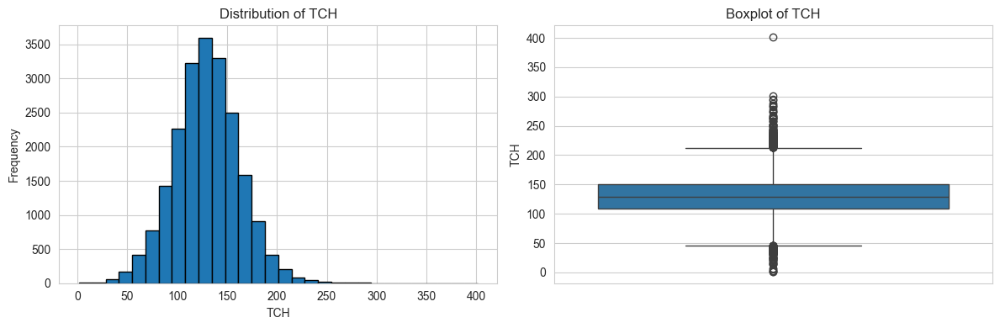

In [8]:
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.hist(df['TCH'], bins=30, edgecolor='black')
plt.title('Distribution of TCH')
plt.xlabel('TCH')
plt.ylabel('Frequency')

plt.subplot(1, 2, 2)
sns.boxplot(y=df['TCH'])
plt.title('Boxplot of TCH')

plt.tight_layout()
plt.show()

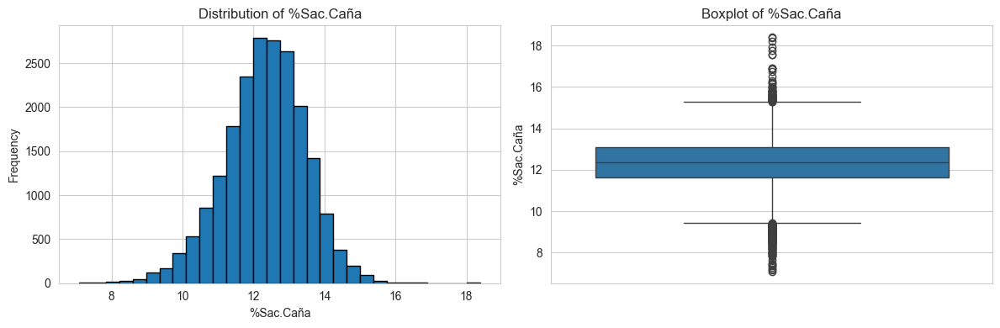

In [9]:
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.hist(df['%Sac.Caña'], bins=30, edgecolor='black')
plt.title('Distribution of %Sac.Caña')
plt.xlabel('%Sac.Caña')
plt.ylabel('Frequency')

plt.subplot(1, 2, 2)
sns.boxplot(y=df['%Sac.Caña'])
plt.title('Boxplot of %Sac.Caña')

plt.tight_layout()
plt.show()

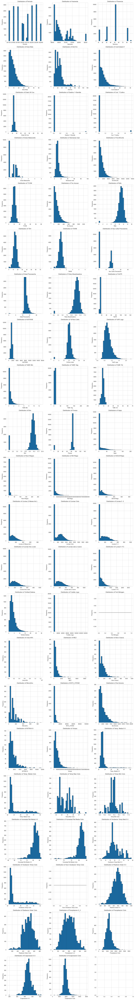

In [10]:
Numerical_features = df.select_dtypes(include=[np.number]).columns
Numerical_features = Numerical_features.drop(['TCH','%Sac.Caña'])

fig, axes = plt.subplots(nrows=(len(Numerical_features)+2)//3, ncols=3, 
                        figsize=(15, 5*((len(Numerical_features)+2)//3)))
axes = axes.ravel()

for i, feature in enumerate(Numerical_features):
    axes[i].hist(df[feature].dropna(), bins=30, edgecolor='black')
    axes[i].set_title(f'Distribution of {feature}')
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

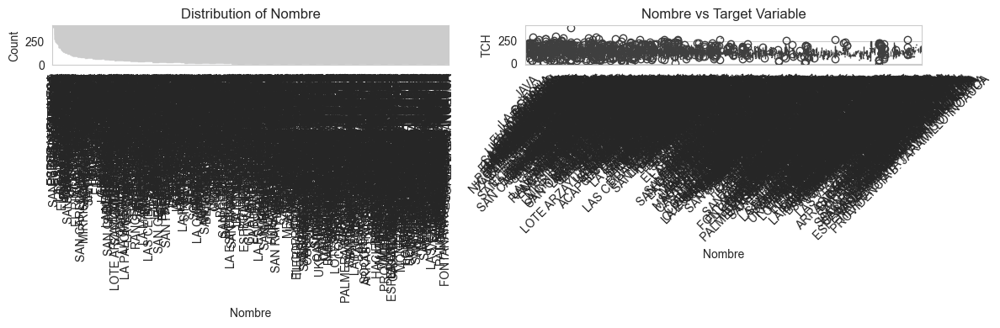

<Figure size 1200x600 with 0 Axes>

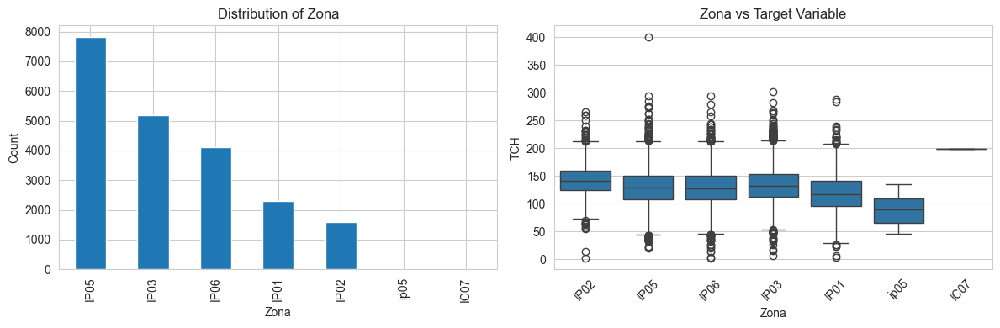

<Figure size 1200x600 with 0 Axes>

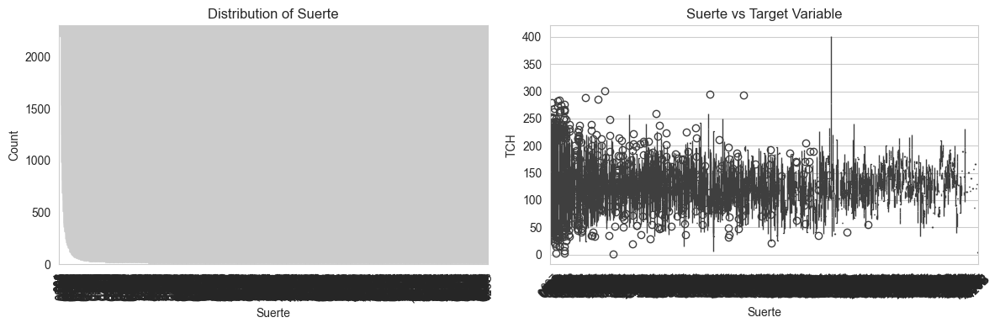

<Figure size 1200x600 with 0 Axes>

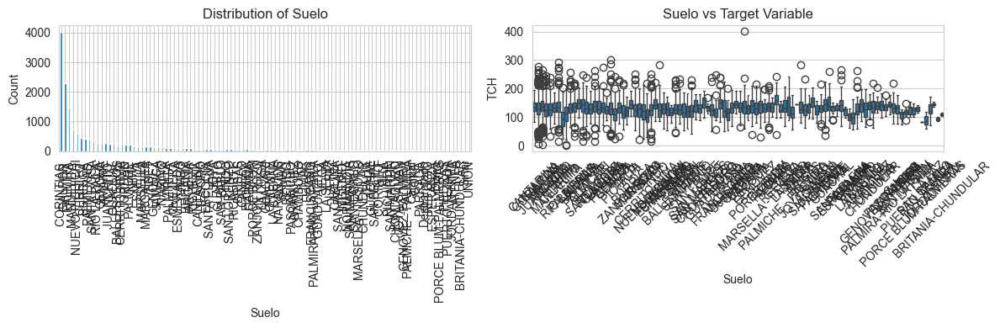

<Figure size 1200x600 with 0 Axes>

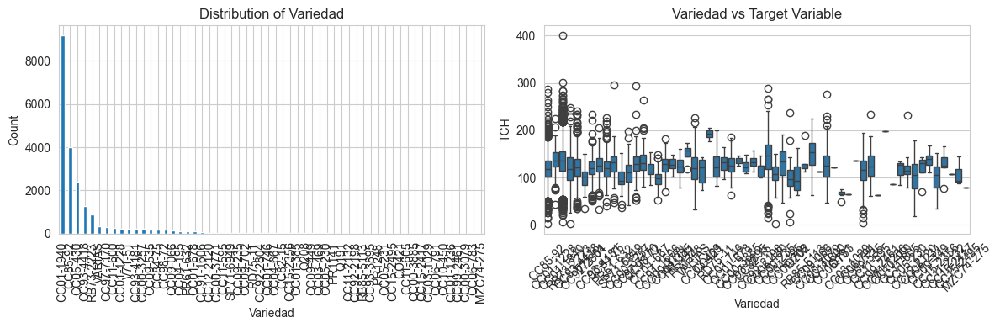

<Figure size 1200x600 with 0 Axes>

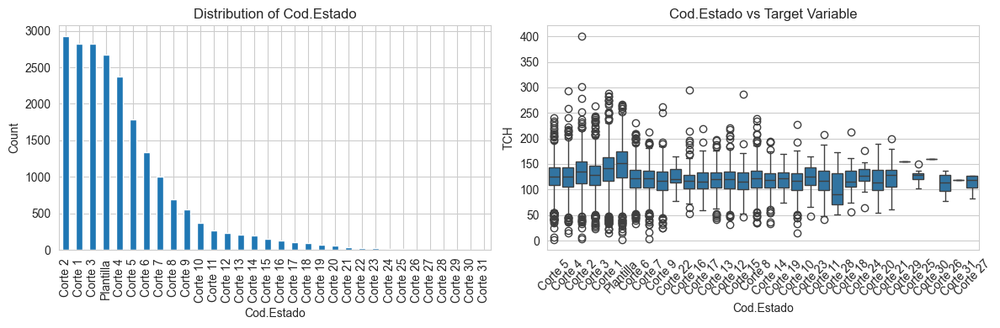

<Figure size 1200x600 with 0 Axes>

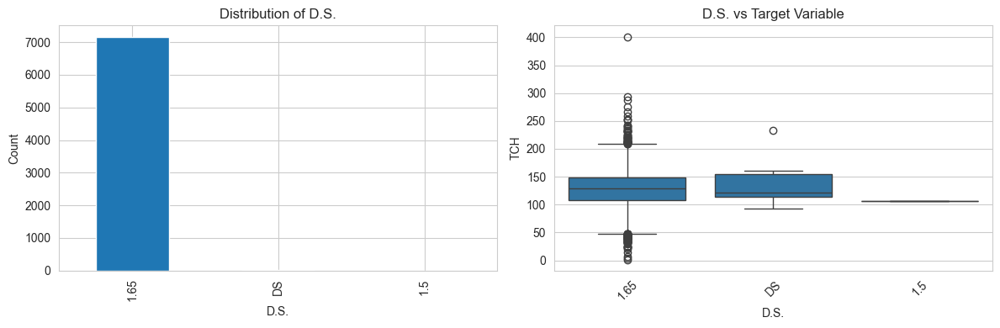

<Figure size 1200x600 with 0 Axes>

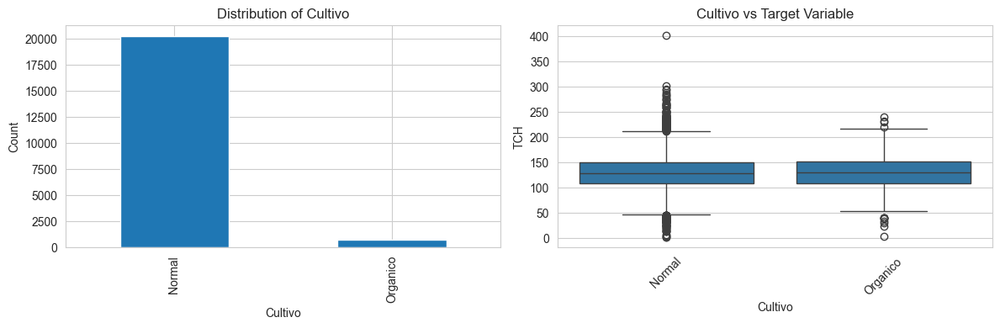

/var/folders/ms/k9n_1hhj4hz1k_gx5t8wnr0r0000gn/T/ipykernel_11288/3084887118.py:17: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


<Figure size 1200x600 with 0 Axes>

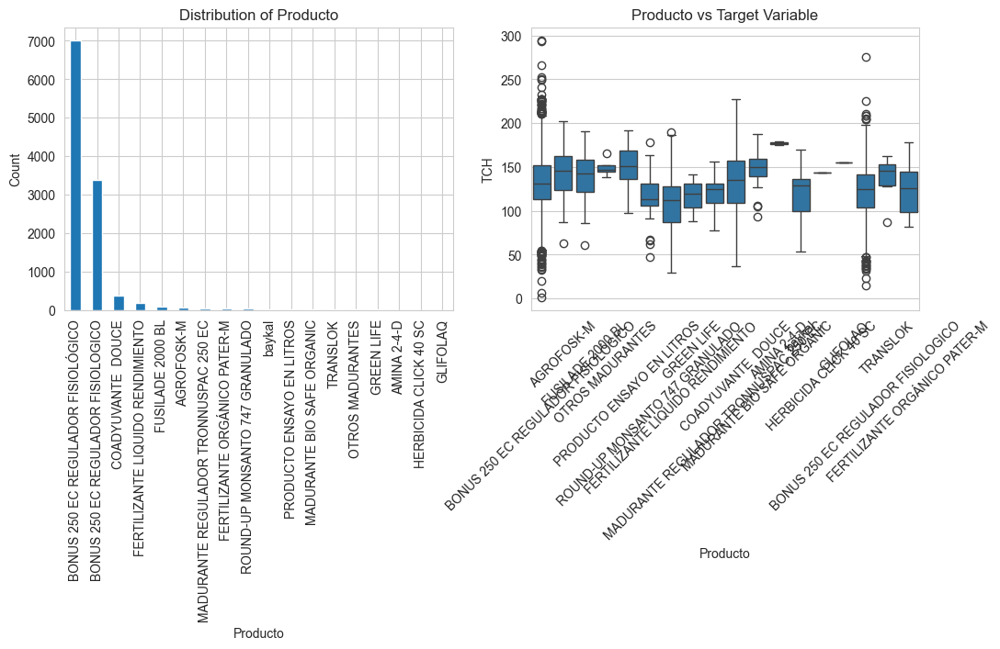

<Figure size 1200x600 with 0 Axes>

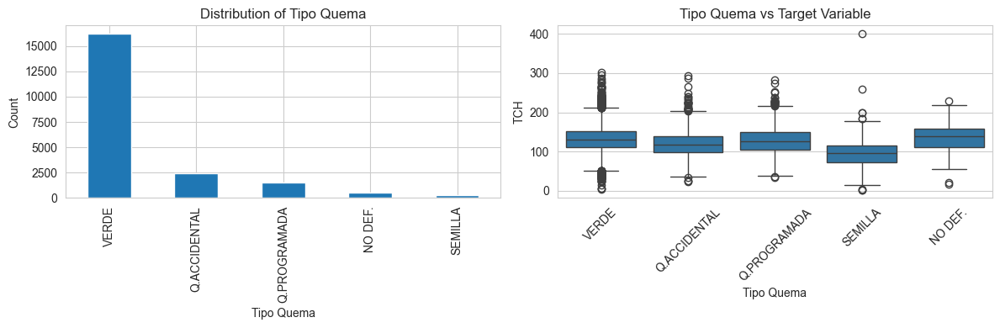

<Figure size 1200x600 with 0 Axes>

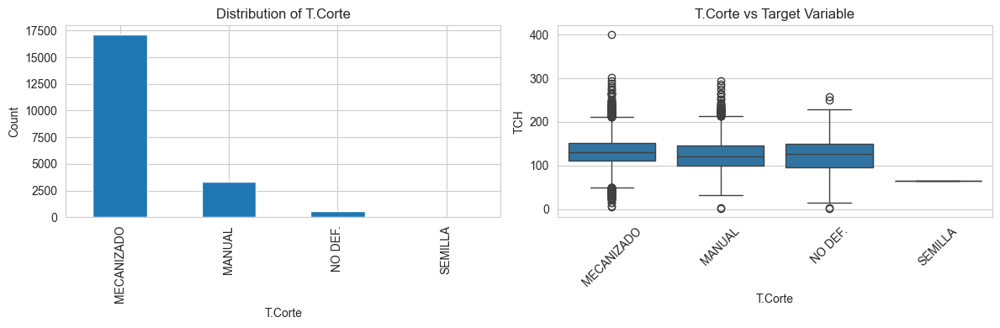

<Figure size 1200x600 with 0 Axes>

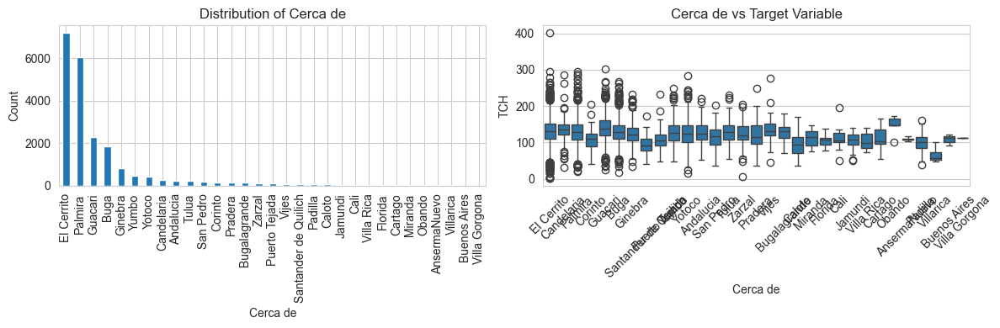

<Figure size 1200x600 with 0 Axes>

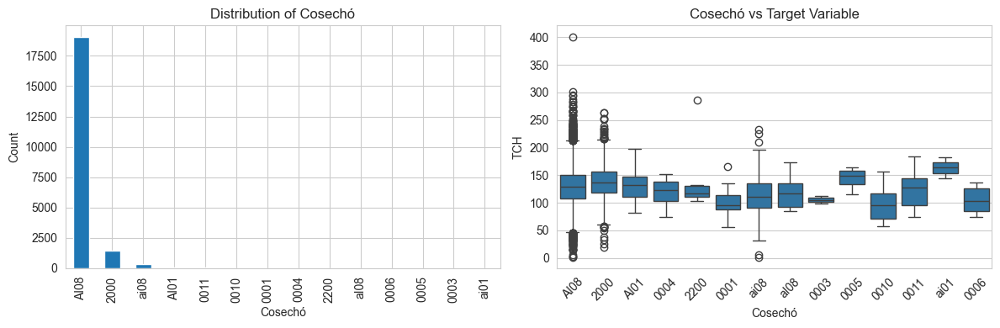

<Figure size 1200x600 with 0 Axes>

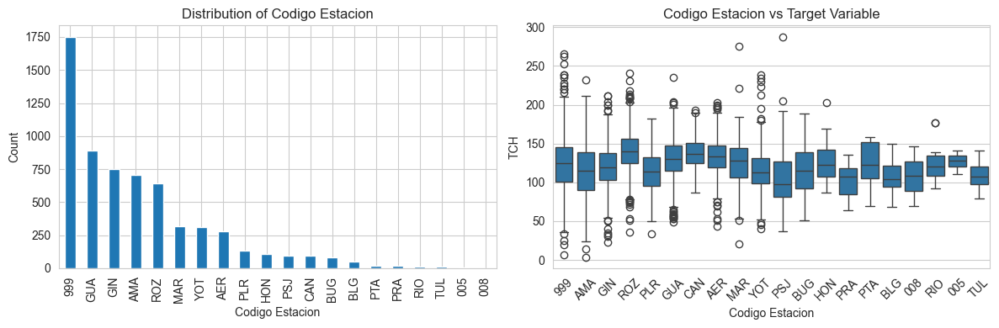

<Figure size 1200x600 with 0 Axes>

In [11]:
categorical_features = df.select_dtypes(include=['object']).columns

for feature in categorical_features:
    plt.figure(figsize=(12, 4))
    
    plt.subplot(1, 2, 1)
    df[feature].value_counts().plot(kind='bar')
    plt.title(f'Distribution of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Count')
    
    plt.subplot(1, 2, 2)
    sns.boxplot(x=feature, y='TCH', data=df)
    plt.title(f'{feature} vs Target Variable')
    plt.xticks(rotation=45)
    
    plt.tight_layout()
    plt.show()
    plt.tight_layout()


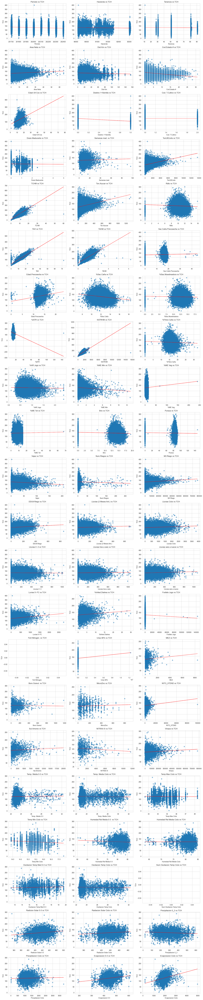

In [12]:
target = "TCH"
numeric_features = df.select_dtypes(include=[np.number]).columns.drop(target)

n_features = len(numeric_features)
ncols = 3  # number of plots per row
nrows = math.ceil(n_features / ncols)

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(6*ncols, 4*nrows))
axes = axes.ravel()

for i, feature in enumerate(numeric_features):
    axes[i].scatter(df[feature], df[target], alpha=0.5)
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel(target)
    axes[i].set_title(f'{feature} vs {target}')
    
    # Add regression line if enough data
    x = df[feature].dropna()
    y = df.loc[df[feature].notna(), target]
    if len(x) > 1:
        z = np.polyfit(x, y, 1)
        p = np.poly1d(z)
        axes[i].plot(x, p(x), "r--", alpha=0.8)

for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

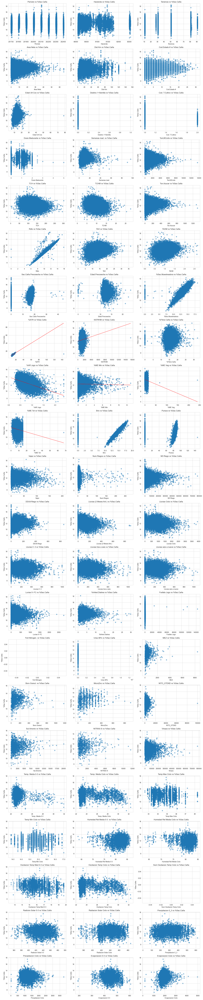

In [13]:
target = "%Sac.Caña"
numeric_features = df.select_dtypes(include=[np.number]).columns.drop(target)

n_features = len(numeric_features)
ncols = 3  # number of plots per row
nrows = math.ceil(n_features / ncols)

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(6*ncols, 4*nrows))
axes = axes.ravel()

for i, feature in enumerate(numeric_features):
    axes[i].scatter(df[feature], df[target], alpha=0.5)
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel(target)
    axes[i].set_title(f'{feature} vs {target}')
    
    # Add regression line if enough data
    x = df[feature].dropna()
    y = df.loc[df[feature].notna(), target]
    if len(x) > 1:
        z = np.polyfit(x, y, 1)
        p = np.poly1d(z)
        axes[i].plot(x, p(x), "r--", alpha=0.8)

for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

## Eda Numerico

In [14]:
total_rows = len(df)

summary = pd.DataFrame({
    "non_nulls": df.notnull().sum(),
    "nulls": df.isnull().sum()
})

summary["nulls_pct"] = (summary["nulls"] / total_rows) * 100
summary["non_nulls_pct"] = (summary["non_nulls"] / total_rows) * 100

print(summary.to_string())

                           non_nulls  nulls   nulls_pct  non_nulls_pct
Período                        21027      0    0.000000     100.000000
Hacienda                       21027      0    0.000000     100.000000
Nombre                         21027      0    0.000000     100.000000
Zona                           21027      0    0.000000     100.000000
Tenencia                       21026      1    0.004756      99.995244
Suerte                         21027      0    0.000000     100.000000
Suelo                          17269   3758   17.872259      82.127741
Area Neta                      21027      0    0.000000     100.000000
Dist Km                        21022      5    0.023779      99.976221
Variedad                       21027      0    0.000000     100.000000
Cod.Estado #                   21027      0    0.000000     100.000000
Cod.Estado                     21027      0    0.000000     100.000000
F.Siembra                      21027      0    0.000000     100.000000
D.S.  

In [15]:
# Definir umbrales
low_nulls = df.isnull().mean() < 0.05     # <5%
medium_nulls = (df.isnull().mean() >= 0.05) & (df.isnull().mean() <= 0.2)
high_nulls = df.isnull().mean() > 0.4

print("Columnas con pocos nulos (<5%):")
print(df.columns[low_nulls])

print("\nColumnas con nulos moderados (5-20%):")
print(df.columns[medium_nulls])

print("\nColumnas con muchos nulos (>40%):")
print(df.columns[high_nulls])

Columnas con pocos nulos (<5%):
Index(['Período', 'Hacienda', 'Nombre', 'Zona', 'Tenencia', 'Suerte',
       'Area Neta', 'Dist Km', 'Variedad', 'Cod.Estado #', 'Cod.Estado',
       'F.Siembra', 'Edad Ult Cos', 'F.Ult.Corte', 'Destino 1=Semilla',
       'Cod. T.Cultivo', 'Cultivo', 'Dosis Madurante', 'TonUltCorte', 'TCH',
       'TCHM', 'Ton.Azucar', 'Rdto', 'TAH', 'TAHM', '%Sac.Caña', '%ATR',
       'KATRHM', 'Brix', 'Pureza', 'Tipo Quema', 'T.Corte', 'Cerca de',
       'Cosechó', 'M3 Riego', 'DDUlt.Riego', 'Lluvias (2 Meses Ant.)',
       'Lluvias Ciclo', 'Lluvias 0 -3', 'Lluvias tres a seis',
       'Lluvias seis a nueve', 'Luvias 9 -FC'],
      dtype='object')

Columnas con nulos moderados (5-20%):
Index(['Suelo', 'Sac.Caña Precosecha', '%Sac.Muestreadora', '%Fibra Caña',
       '%AR Jugo', '%ME Min', '%ME Veg', '%ME Tot', 'Vejez', 'Fosfato Jugo'],
      dtype='object')

Columnas con muchos nulos (>40%):
Index(['D.S.', 'Ult.Riego', 'Fec.Madur.', 'Producto', 'Semanas mad.',
       '

In [16]:
cols_to_drop = summary[summary["nulls_pct"] > 70].index

print("Columnas eliminadas (más de 70% nulos):")
print(cols_to_drop)

# Eliminar esas columnas
df_clean = df.drop(columns=cols_to_drop)


Columnas eliminadas (más de 70% nulos):
Index(['%Infest.Diatrea', 'Fert.Nitrogen.', 'Urea 46%', 'MEZ', 'Boro Granul.',
       'MicroZinc', 'NITO_XTEND', 'Sul.Amonio', 'NITRAX-S', 'Vinaza',
       'Codigo Estacion', 'Temp. Media 0-3', 'Temp. Media Ciclo',
       'Temp Max Ciclo', 'Temp Min Ciclo', 'Humedad Rel Media 0-3 ',
       'Humedad Rel Media Ciclo', 'Oscilacion Temp Med 0-3',
       'Oscilacion Temp Ciclo', 'Sum Oscilacion Temp Ciclo',
       'Radicion Solar 0-3', 'Radiacion Solar Ciclo', 'Precipitacion 0_3',
       'Precipitacion Ciclo', 'Evaporacion 0-3', 'Evaporacion Ciclo'],
      dtype='object')


In [17]:
# Numéricas
num_cols = df_clean.select_dtypes(include=['int64', 'float64']).columns
print("Columnas numéricas:", num_cols)

# Categóricas / objetos
cat_cols = df_clean.select_dtypes(include=['object']).columns
print("Columnas categóricas:", cat_cols)


Columnas numéricas: Index(['Período', 'Hacienda', 'Tenencia', 'Area Neta', 'Dist Km',
       'Cod.Estado #', 'Edad Ult Cos', 'Destino 1=Semilla', 'Cod. T.Cultivo',
       'Dosis Madurante', 'Semanas mad.', 'TonUltCorte', 'TCH', 'TCHM',
       'Ton.Azucar', 'Rdto', 'TAH', 'TAHM', 'Sac.Caña Precosecha',
       'Edad.Precosecha', '%Sac.Caña', '%Sac.Muestreadora', '%ATR', 'KATRHM',
       '%Fibra Caña', '%AR Jugo', '%ME Min', '%ME Veg', '%ME Tot', 'Brix',
       'Pureza', 'Vejez', 'Num.Riegos', 'M3 Riego', 'DDUlt.Riego',
       'Lluvias (2 Meses Ant.)', 'Lluvias Ciclo', 'Lluvias 0 -3',
       'Lluvias tres a seis', 'Lluvias seis a nueve', 'Luvias 9 -FC',
       'Fosfato Jugo'],
      dtype='object')
Columnas categóricas: Index(['Nombre', 'Zona', 'Suerte', 'Suelo', 'Variedad', 'Cod.Estado', 'D.S.',
       'Cultivo', 'Producto', 'Tipo Quema', 'T.Corte', 'Cerca de', 'Cosechó'],
      dtype='object')


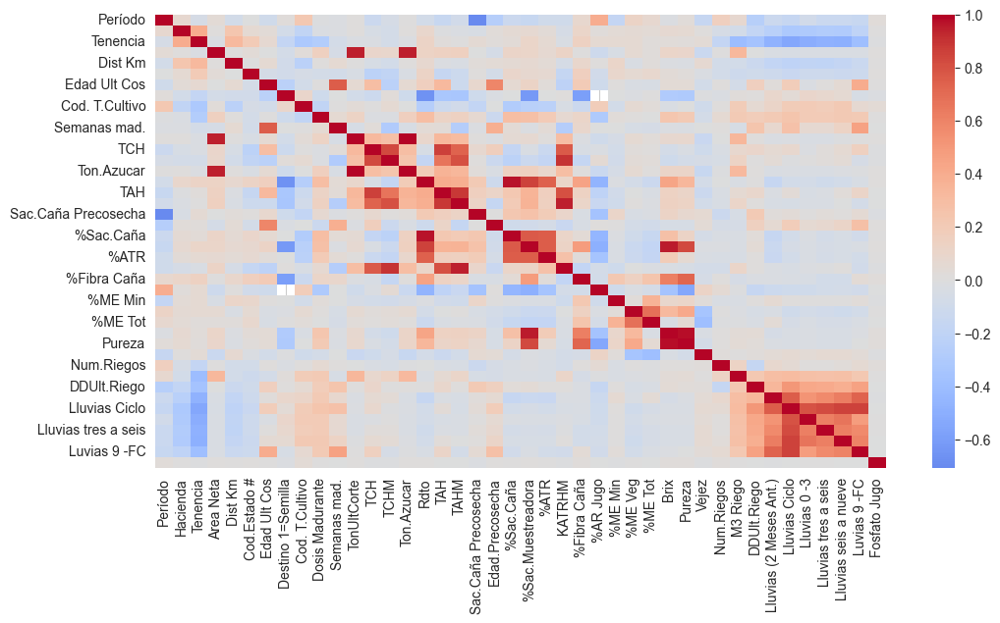


Correlación con TCH:
TCH                       1.000000
TAH                       0.866165
TCHM                      0.829980
KATRHM                    0.767925
TAHM                      0.737953
TonUltCorte               0.320696
Edad Ult Cos              0.298166
Ton.Azucar                0.295671
Edad.Precosecha           0.168624
Luvias 9 -FC              0.156767
DDUlt.Riego               0.093181
Area Neta                 0.093021
M3 Riego                  0.084436
Lluvias Ciclo             0.084137
Sac.Caña Precosecha       0.074032
Lluvias seis a nueve      0.064228
Lluvias (2 Meses Ant.)    0.054965
Semanas mad.              0.026300
%ME Veg                   0.023459
Lluvias tres a seis       0.020998
%ME Tot                   0.011984
Cod. T.Cultivo            0.003561
Fosfato Jugo             -0.010491
Dosis Madurante          -0.015048
Lluvias 0 -3             -0.015646
Tenencia                 -0.021055
%AR Jugo                 -0.027098
%Sac.Muestreadora        -0.02958

In [18]:
corr = df_clean[num_cols].corr()
sns.heatmap(corr, annot=False, cmap="coolwarm", center=0)
plt.show()
print("\nCorrelación con TCH:")
print(corr["TCH"].sort_values(ascending=False).to_string())

print("-"*100)
print("\nCorrelación con %Sac.Caña:")
print(corr["%Sac.Caña"].sort_values(ascending=False).to_string())


In [19]:
drop_cols = ["Nombre", "Suerte", "Producto", "D.S.","TCHM"]
df_clean = df_clean.drop(columns=drop_cols)
# - Convertir 'Cosechó' a mayúsculas
df_clean["Cosechó"] = df_clean["Cosechó"].astype(str).str.upper().str.strip()

# - Convertir 'Zona' también a mayúsculas (porque tenías 'IP05' y 'ip05')
df_clean["Zona"] = df_clean["Zona"].astype(str).str.upper().str.strip()

## Prediccion TCH

In [20]:
Drop_variables_TCH_correlated = ['TAH','TCHM','KATRHM','TAHM']
Drop_variables_TCH_correlated_total = ['TAH','TCHM','KATRHM','TAHM','Semanas mad.','%ME Veg','Lluvias tres a seis','%ME Tot','Cod. T.Cultivo','Fosfato Jugo','Dosis Madurante','Lluvias 0 -3']

In [21]:
df_clean_base = df_clean.copy()

df_clean_tch_correlated = df_clean_base.drop(
    columns=Drop_variables_TCH_correlated, errors="ignore"
).copy()

In [22]:
df_clean_tch_correlated.head()

,Período,Hacienda,Zona,Tenencia,Suelo,Area Neta,Dist Km,Variedad,Cod.Estado #,Cod.Estado,...,Num.Riegos,M3 Riego,DDUlt.Riego,Lluvias (2 Meses Ant.),Lluvias Ciclo,Lluvias 0 -3,Lluvias tres a seis,Lluvias seis a nueve,Luvias 9 -FC,Fosfato Jugo
0,201701,80493,IP02,51.0,CANTARINA,6.00,4.3,CC85-92,5,Corte 5,...,NaN,0.0,0,258.0,1038.0,0.0,454.0,102.0,482.0,178.0
1,201701,81284,IP05,81.0,NaN,1.45,NaN,CC85-92,5,Corte 5,...,NaN,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,382.0
2,201701,80203,IP05,31.0,CORINTIAS,8.24,23.0,CC01-1228,4,Corte 4,...,5.0,48513.6,107,246.0,1002.0,106.0,326.0,113.0,457.0,226.0
3,201701,81380,IP05,82.0,NaN,1.05,66.5,CC01-1940,2,Corte 2,...,NaN,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,278.0
4,201701,80298,IP06,31.0,GALPON,4.53,17.0,RB73-2223,3,Corte 3,...,NaN,0.0,0,138.0,991.0,264.0,255.0,188.0,284.0,244.0


In [23]:
df_clean_tch_correlated.head()


,Período,Hacienda,Zona,Tenencia,Suelo,Area Neta,Dist Km,Variedad,Cod.Estado #,Cod.Estado,...,Num.Riegos,M3 Riego,DDUlt.Riego,Lluvias (2 Meses Ant.),Lluvias Ciclo,Lluvias 0 -3,Lluvias tres a seis,Lluvias seis a nueve,Luvias 9 -FC,Fosfato Jugo
0,201701,80493,IP02,51.0,CANTARINA,6.00,4.3,CC85-92,5,Corte 5,...,NaN,0.0,0,258.0,1038.0,0.0,454.0,102.0,482.0,178.0
1,201701,81284,IP05,81.0,NaN,1.45,NaN,CC85-92,5,Corte 5,...,NaN,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,382.0
2,201701,80203,IP05,31.0,CORINTIAS,8.24,23.0,CC01-1228,4,Corte 4,...,5.0,48513.6,107,246.0,1002.0,106.0,326.0,113.0,457.0,226.0
3,201701,81380,IP05,82.0,NaN,1.05,66.5,CC01-1940,2,Corte 2,...,NaN,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,278.0
4,201701,80298,IP06,31.0,GALPON,4.53,17.0,RB73-2223,3,Corte 3,...,NaN,0.0,0,138.0,991.0,264.0,255.0,188.0,284.0,244.0


In [24]:
cat_cols = df_clean.select_dtypes(include=['object']).columns
cardinalidad = {col: df_clean_tch_correlated[col].nunique() for col in cat_cols}
print(cardinalidad)


{'Zona': 6, 'Suelo': 102, 'Variedad': 58, 'Cod.Estado': 32, 'Cultivo': 2, 'Tipo Quema': 5, 'T.Corte': 4, 'Cerca de': 31, 'Cosechó': 11}


In [25]:
y = df_clean_tch_correlated["TCH"]  # target principal
X = df_clean_tch_correlated.drop(columns=["TCH"])  # sacamos los targets


cat_cols = X.select_dtypes(include="object").columns
num_cols = X.select_dtypes(include=["int64", "float64"]).columns

high_card_cols = ["Cerca de", "Cod.Estado", "Variedad", "Suelo"]
low_card_cols = list(set(cat_cols) - set(high_card_cols))


In [26]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

In [27]:
onehot_pipeline = Pipeline(steps=[
    ("imputer", SimpleImputer(strategy="most_frequent")),  
    ("onehot", OneHotEncoder(handle_unknown="ignore", sparse_output=False))
])

# Target encoding para alta cardinalidad
targetenc_pipeline = Pipeline(steps=[
    ("imputer", SimpleImputer(strategy="constant", fill_value="DESCONOCIDO")),  # imputar NaNs
    ("targetenc", TargetEncoder(smoothing=0.3))
])

# Numéricas MICE + escalado
num_pipeline = Pipeline(steps=[
    ("imputer", IterativeImputer(random_state=42, max_iter=10)),
    ("scaler", StandardScaler())
])

In [37]:
preprocessor = ColumnTransformer(
    transformers=[
        ("num", num_pipeline, num_cols),
        ("low_card", onehot_pipeline, low_card_cols),
        ("high_card", targetenc_pipeline, high_card_cols),
    ]
)
models = {
    "LinearRegression": (
        LinearRegression(),
        {
            "regressor__fit_intercept": [True, False],
            "regressor__positive": [False, True],
        },
    ),
    "Ridge": (
        Ridge(),
        {
            "regressor__alpha": [0.001, 0.01, 0.1, 1, 10, 100, 1000],
            "regressor__fit_intercept": [True, False],
            "regressor__solver": ["auto", "svd", "cholesky", "lsqr", "saga"],
        },
    ),
    "Lasso": (
        Lasso(),
        {
            "regressor__alpha": [0.001, 0.01, 0.1, 1, 10],
            "regressor__fit_intercept": [True, False],
            "regressor__selection": ["cyclic", "random"],
        },
    ),
    "ElasticNet": (
        ElasticNet(),
        {
            "regressor__alpha": [0.001, 0.01, 0.1, 1, 10],
            "regressor__l1_ratio": [0.1, 0.3, 0.5, 0.7, 0.9],
            "regressor__fit_intercept": [True, False],
            "regressor__selection": ["cyclic", "random"],
        },
    ),
    "KNN": (
        KNeighborsRegressor(),
        {
            "regressor__n_neighbors": [3, 5, 7, 9, 11, 15],
            "regressor__weights": ["uniform", "distance"],
            "regressor__metric": ["euclidean", "manhattan", "minkowski"],
            "regressor__p": [1, 2],  # 1 = manhattan, 2 = euclidean
        },
    ),
}



In [38]:
results = []

for name, (reg, params) in models.items():
    print(f"\n--- Entrenando {name} ---")
    
    pipe = Pipeline(steps=[
        ("preprocessor", preprocessor),
        ("regressor", reg),
    ])
    
    grid = GridSearchCV(
        pipe, params, cv=5,
        scoring="neg_mean_squared_error", n_jobs=-1
    )
    grid.fit(X_train, y_train)
    
    # Best model
    best_model = grid.best_estimator_
    y_pred = best_model.predict(X_test)
    
    # Métricas
    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    results.append({
        "Modelo": name,
        "Mejores Hiperparámetros": grid.best_params_,
        "CV MSE": -grid.best_score_,
        "Test MSE": mse,
        "Test MAE": mae,
        "Test R²": r2,
    })


--- Entrenando LinearRegression ---

--- Entrenando Ridge ---


/Users/santiagoaristizabal/Desktop/Taller_final_AA1/.venv/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/santiagoaristizabal/Desktop/Taller_final_AA1/.venv/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/santiagoaristizabal/Desktop/Taller_final_AA1/.venv/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/santiagoaristizabal/Desktop/Taller_final_AA1/.venv/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/santiagoaristizabal/Desktop/Taller_final_AA1/.venv/lib/python3.12/site-packages/sklearn/linear_model/_sag


--- Entrenando Lasso ---


/Users/santiagoaristizabal/Desktop/Taller_final_AA1/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.561e+04, tolerance: 1.444e+03
  model = cd_fast.enet_coordinate_descent(
/Users/santiagoaristizabal/Desktop/Taller_final_AA1/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.576e+05, tolerance: 1.444e+03
  model = cd_fast.enet_coordinate_descent(
/Users/santiagoaristizabal/Desktop/Taller_final_AA1/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increa


--- Entrenando ElasticNet ---


/Users/santiagoaristizabal/Desktop/Taller_final_AA1/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.246e+05, tolerance: 1.444e+03
  model = cd_fast.enet_coordinate_descent(
/Users/santiagoaristizabal/Desktop/Taller_final_AA1/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.319e+06, tolerance: 1.444e+03
  model = cd_fast.enet_coordinate_descent(
/Users/santiagoaristizabal/Desktop/Taller_final_AA1/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increa


--- Entrenando KNN ---

=== Comparación de Modelos ===
             Modelo                            Mejores Hiperparámetros  \
0  LinearRegression  {'regressor__fit_intercept': True, 'regressor_...   
1             Ridge  {'regressor__alpha': 10, 'regressor__fit_inter...   
2             Lasso  {'regressor__alpha': 0.01, 'regressor__fit_int...   
3        ElasticNet  {'regressor__alpha': 0.01, 'regressor__fit_int...   
4               KNN  {'regressor__metric': 'manhattan', 'regressor_...   

       CV MSE    Test MSE   Test MAE   Test R²  
0  429.683963  427.285122  14.344269  0.615120  
1  425.854527  425.937889  14.339288  0.616334  
2  420.869534  425.979371  14.311860  0.616296  
3  421.796026  425.675485  14.336763  0.616570  
4  609.029810  610.769067  18.377078  0.449846  


In [39]:
results_df = pd.DataFrame(results)
print("\n=== Comparación de Modelos ===")
print(results_df)


=== Comparación de Modelos ===
             Modelo                            Mejores Hiperparámetros  \
0  LinearRegression  {'regressor__fit_intercept': True, 'regressor_...   
1             Ridge  {'regressor__alpha': 10, 'regressor__fit_inter...   
2             Lasso  {'regressor__alpha': 0.01, 'regressor__fit_int...   
3        ElasticNet  {'regressor__alpha': 0.01, 'regressor__fit_int...   
4               KNN  {'regressor__metric': 'manhattan', 'regressor_...   

       CV MSE    Test MSE   Test MAE   Test R²  
0  429.683963  427.285122  14.344269  0.615120  
1  425.854527  425.937889  14.339288  0.616334  
2  420.869534  425.979371  14.311860  0.616296  
3  421.796026  425.675485  14.336763  0.616570  
4  609.029810  610.769067  18.377078  0.449846  


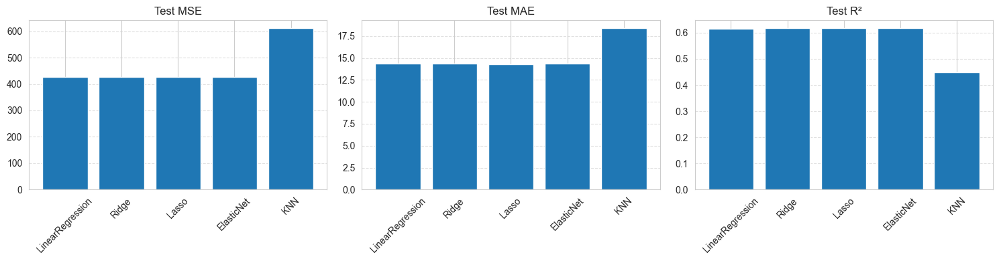

In [40]:
metrics = ["Test MSE", "Test MAE", "Test R²"]

fig, axes = plt.subplots(1, 3, figsize=(15, 4))

for i, metric in enumerate(metrics):
    axes[i].bar(results_df["Modelo"], results_df[metric])
    axes[i].set_title(metric)
    axes[i].tick_params(axis='x', rotation=45)
    axes[i].grid(True, axis='y', linestyle="--", alpha=0.6)

plt.tight_layout()
plt.show()


In [ ]:
len(df_clean_tch_correlated.columns)

## Prediccion %sac

In [41]:
df_clean.columns

Index(['Período', 'Hacienda', 'Zona', 'Tenencia', 'Suelo', 'Area Neta',
       'Dist Km', 'Variedad', 'Cod.Estado #', 'Cod.Estado', 'F.Siembra',
       'Ult.Riego', 'Edad Ult Cos', 'F.Ult.Corte', 'Destino 1=Semilla',
       'Cod. T.Cultivo', 'Cultivo', 'Fec.Madur.', 'Dosis Madurante',
       'Semanas mad.', 'TonUltCorte', 'TCH', 'Ton.Azucar', 'Rdto', 'TAH',
       'TAHM', 'Sac.Caña Precosecha', 'Edad.Precosecha', '%Sac.Caña',
       '%Sac.Muestreadora', '%ATR', 'KATRHM', '%Fibra Caña', '%AR Jugo',
       '%ME Min', '%ME Veg', '%ME Tot', 'Brix', 'Pureza', 'Vejez',
       'Tipo Quema', 'T.Corte', 'Cerca de', 'Cosechó', 'Num.Riegos',
       'M3 Riego', 'DDUlt.Riego', 'Lluvias (2 Meses Ant.)', 'Lluvias Ciclo',
       'Lluvias 0 -3', 'Lluvias tres a seis', 'Lluvias seis a nueve',
       'Luvias 9 -FC', 'Fosfato Jugo'],
      dtype='object')

In [49]:
df_clean = df_clean.dropna(subset=["%Sac.Caña"])

In [50]:
df_clean.isnull().sum()

Período                       0
Hacienda                      0
Zona                          0
Tenencia                      1
Suelo                      3731
Area Neta                     0
Dist Km                       5
Variedad                      0
Cod.Estado #                  0
Cod.Estado                    0
F.Siembra                     0
Ult.Riego                 12424
Edad Ult Cos                  0
F.Ult.Corte                   0
Destino 1=Semilla             0
Cod. T.Cultivo                2
Cultivo                       2
Fec.Madur.                 9416
Dosis Madurante              96
Semanas mad.               9416
TonUltCorte                   0
TCH                           0
Ton.Azucar                    0
Rdto                          0
TAH                           0
TAHM                          0
Sac.Caña Precosecha        1093
Edad.Precosecha           11670
%Sac.Caña                     0
%Sac.Muestreadora          1591
%ATR                         73
KATRHM  

In [51]:
Drop_variables_sac_correlated = ['Rdto','%Sac.Muestreadora','%ATR']

In [52]:
df_clean_base = df_clean.copy()


df_clean_sac_correlated = df_clean_base.drop(
    columns=Drop_variables_TCH_correlated, errors="ignore"
).copy()

In [53]:
y = df_clean_sac_correlated["%Sac.Caña"]  # target principal
X = df_clean_sac_correlated.drop(columns=["%Sac.Caña"])  # sacamos los targets

# =========================
# Identificar variables
# =========================
cat_cols = X.select_dtypes(include="object").columns
num_cols = X.select_dtypes(include=["int64", "float64"]).columns

high_card_cols = ["Cerca de", "Cod.Estado", "Variedad", "Suelo"]

low_card_cols = list(set(cat_cols) - set(high_card_cols))

In [54]:

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

onehot_pipeline = Pipeline(steps=[
    ("imputer", SimpleImputer(strategy="most_frequent")),  # imputar con la moda
    ("onehot", OneHotEncoder(handle_unknown="ignore", sparse_output=False))
])

# Target encoding para alta cardinalidad
targetenc_pipeline = Pipeline(steps=[
    ("imputer", SimpleImputer(strategy="constant", fill_value="DESCONOCIDO")),  # imputar NaNs
    ("targetenc", TargetEncoder(smoothing=0.3))
])

# Numéricas → MICE + escalado
num_pipeline = Pipeline(steps=[
    ("imputer", IterativeImputer(random_state=42, max_iter=10)),
    ("scaler", StandardScaler())
])

# =========================
# ColumnTransformer
# =========================
preprocessor = ColumnTransformer(
    transformers=[
        ("num", num_pipeline, num_cols),
        ("low_card", onehot_pipeline, low_card_cols),
        ("high_card", targetenc_pipeline, high_card_cols),
    ]
)

In [55]:
results = []

for name, (reg, params) in models.items():
    print(f"\n--- Entrenando {name} ---")
    
    pipe = Pipeline(steps=[
        ("preprocessor", preprocessor),
        ("regressor", reg),
    ])
    
    grid = GridSearchCV(
        pipe, params, cv=5,
        scoring="neg_mean_squared_error", n_jobs=-1
    )
    grid.fit(X_train, y_train)
    
    # Best model
    best_model = grid.best_estimator_
    y_pred = best_model.predict(X_test)
    
    # Métricas
    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    results.append({
        "Modelo": name,
        "Mejores Hiperparámetros": grid.best_params_,
        "CV MSE": -grid.best_score_,
        "Test MSE": mse,
        "Test MAE": mae,
        "Test R²": r2,
    })



--- Entrenando LinearRegression ---

--- Entrenando Ridge ---


/Users/santiagoaristizabal/Desktop/Taller_final_AA1/.venv/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/santiagoaristizabal/Desktop/Taller_final_AA1/.venv/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/santiagoaristizabal/Desktop/Taller_final_AA1/.venv/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/santiagoaristizabal/Desktop/Taller_final_AA1/.venv/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/santiagoaristizabal/Desktop/Taller_final_AA1/.venv/lib/python3.12/site-packages/sklearn/linear_model/_sag


--- Entrenando Lasso ---


/Users/santiagoaristizabal/Desktop/Taller_final_AA1/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.365e+02, tolerance: 2.019e+02
  model = cd_fast.enet_coordinate_descent(
/Users/santiagoaristizabal/Desktop/Taller_final_AA1/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.651e+02, tolerance: 2.017e+02
  model = cd_fast.enet_coordinate_descent(
/Users/santiagoaristizabal/Desktop/Taller_final_AA1/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increa


--- Entrenando ElasticNet ---


/Users/santiagoaristizabal/Desktop/Taller_final_AA1/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.043e+00, tolerance: 1.729e+00
  model = cd_fast.enet_coordinate_descent(
/Users/santiagoaristizabal/Desktop/Taller_final_AA1/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.855e+00, tolerance: 1.715e+00
  model = cd_fast.enet_coordinate_descent(
/Users/santiagoaristizabal/Desktop/Taller_final_AA1/.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increa


--- Entrenando KNN ---


In [56]:
results_df = pd.DataFrame(results)
print("\n=== Comparación de Modelos ===")
print(results_df)


=== Comparación de Modelos ===
             Modelo                            Mejores Hiperparámetros  \
0  LinearRegression  {'regressor__fit_intercept': True, 'regressor_...   
1             Ridge  {'regressor__alpha': 0.001, 'regressor__fit_in...   
2             Lasso  {'regressor__alpha': 0.001, 'regressor__fit_in...   
3        ElasticNet  {'regressor__alpha': 0.001, 'regressor__fit_in...   
4               KNN  {'regressor__metric': 'manhattan', 'regressor_...   

     CV MSE  Test MSE  Test MAE   Test R²  
0  0.236325  0.026545  0.070141  0.980028  
1  0.233121  0.030680  0.088974  0.976916  
2  0.252374  0.035395  0.080169  0.973369  
3  0.243199  0.029780  0.074241  0.977593  
4  0.223169  0.197559  0.323418  0.851356  
